In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import csv
import json
import os
import folium

In [2]:
os.listdir('.')

['.ipynb_checkpoints',
 'clustering.ipynb',
 'simple_dot_plot.html',
 'test0.json',
 'test1.json',
 'test2.json',
 'test3.json',
 'test4.json']

In [3]:
json_path = 'test2.json'

with open(json_path) as json_file:
    data = json.load(json_file)
print(len(data['matrix']))

4573


In [4]:
locations = data['locations']
matrix = data['matrix']
K = data['K']
print("Number of Locations: {}".format(len(locations)))
print("Number of Clusters: {}".format(K))

Number of Locations: 4573
Number of Clusters: 205


In [5]:
data_df = []
for location in locations:
    lat = location['lat']
    lng = location['lng']
    data_df.append([lat,lng])
data_df = pd.DataFrame(data_df,columns=['lat','lng'])
data_df.head()

,lat,lng
0,43.317825,76.923396
1,43.211953,76.898346
2,43.337443,76.922463
3,43.237933,76.858653
4,43.258795,76.918127


# KMeans

In [6]:
kmeans = KMeans(n_clusters = K, init ='k-means++')
kmeans.fit(data_df) # Compute k-means clustering.
data_df['cluster_label'] = kmeans.fit_predict(data_df)
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
# labels = kmeans.predict(data_df[data_df.columns[1:3]]) # Labels of each point

In [7]:
labels = data_df['cluster_label']

In [8]:
data_df.head()

,lat,lng,cluster_label
0,43.317825,76.923396,128
1,43.211953,76.898346,176
2,43.337443,76.922463,167
3,43.237933,76.858653,153
4,43.258795,76.918127,18


In [9]:
# Create color palette of hex
import matplotlib
palette = sns.color_palette(None, K)
cmaplist = palette.as_hex()
def get_color_from_label(label):
    return matplotlib.colors.rgb2hex(cmaplist[label-1])
get_color_from_label(K)

'#8172b3'

In [10]:
def show_on_map(data_df):    
    #create a map
    this_map = folium.Map(prefer_canvas=True)

    def plotDot(point):
        '''input: series that contains a numeric named latitude and a numeric named longitude
        this function creates a CircleMarker and adds it to your this_map'''
        folium.CircleMarker(location=[point.lat, point.lng],
                            radius=2,
                            color=get_color_from_label(int(point.cluster_label)),
                            weight=5).add_to(this_map)

    #use df.apply(,axis=1) to "iterate" through every row in your dataframe
    data_df.apply(plotDot, axis = 1)


    #Set the zoom to the maximum possible
    this_map.fit_bounds(this_map.get_bounds())

    #Save the map to an HTML file
    this_map.save('simple_dot_plot.html')

    return this_map


C:\Users\00050429\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


standard deviation:  629384.3662063678


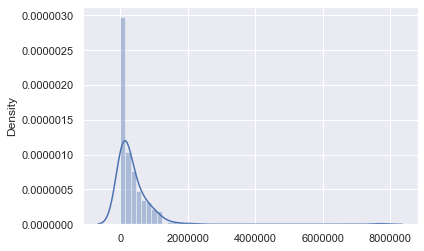

In [11]:
def show_dist(K,matrix,labels):
    '''
    This method shows sum of distances of each cluster and it's distribution.
    '''
    cluster_distance_sum = [0]*K
    cluster_distance_count = [0]*K
    for i in range(len(matrix)):
        for j in range(i+1,len(matrix)):
            if labels[i] == labels[j]:
                cluster_distance_sum[labels[i]] += matrix[i][j]
                cluster_distance_count[labels[i]] += 1
    sns.distplot(cluster_distance_sum)
#     sns.distplot(cluster_distance_count)
    print("standard deviation: ",np.std(cluster_distance_sum))
#     sns.distplot(np.divide(cluster_distance_sum,cluster_distance_count))
show_dist(K,matrix,labels)

In [12]:
show_on_map(data_df)

In [13]:
matrix = np.array(matrix)

In [14]:
matrix[matrix < 0] = 0

In [15]:
from sklearn.metrics import  silhouette_score
from sklearn.metrics import davies_bouldin_score
def show_scores(matrix,data_df):
    
    silhouette_avg = silhouette_score(data_df[data_df.columns[1:3]], data_df['cluster_label'])
    print("By Geolocations",
        "For n_clusters =",
        K,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    silhouette_avg = silhouette_score(matrix,data_df['cluster_label'],metric='precomputed')
    print("By distance matrix",
        "For n_clusters =",
        K,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    print()
    dunn_score = davies_bouldin_score(data_df[data_df.columns[1:3]],data_df['cluster_label'])
    print("By Geolocations",
        "For n_clusters =",
        K,
        "The average dunn score is :",
        dunn_score,
    )
    
    dunn_score = davies_bouldin_score(matrix,data_df['cluster_label'])
    print("By distance matrix",
        "For n_clusters =",
        K,
        "The average dunn score is :",
        dunn_score,
    )
show_scores(matrix,data_df)

By Geolocations For n_clusters = 205 The average silhouette_score is : 0.9957356517308212
By distance matrix For n_clusters = 205 The average silhouette_score is : 0.26597144693438185

By Geolocations For n_clusters = 205 The average dunn score is : 0.005409424278853111
By distance matrix For n_clusters = 205 The average dunn score is : 1.6407397076215524


# AgglomerativeClustering

# geolocations

In [16]:
from sklearn.cluster import AgglomerativeClustering
agg = AgglomerativeClustering(n_clusters=K, linkage = 'average')
labels = agg.fit_predict(data_df[data_df.columns[1:3]])
data_df['cluster_label'] = labels
show_on_map(data_df)

C:\Users\00050429\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


standard deviation:  629389.128699132


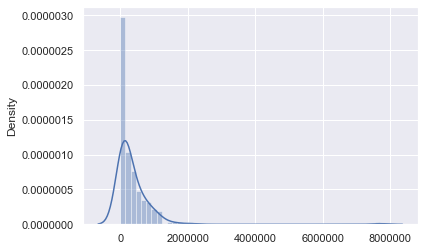

In [17]:
show_dist(K,matrix,labels)

# precomputed

In [18]:
from sklearn.cluster import AgglomerativeClustering
agg = AgglomerativeClustering(n_clusters=K, affinity='precomputed', linkage = 'average')
labels = agg.fit_predict(matrix)

In [19]:
data_df['cluster_label'] = labels

In [20]:
show_on_map(data_df)

standard deviation:  3967614.474054627


C:\Users\00050429\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


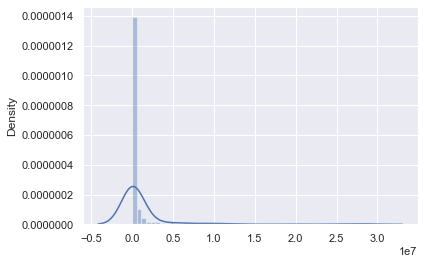

In [21]:
show_dist(K,matrix,labels)

In [22]:
show_scores(matrix,data_df)

By Geolocations For n_clusters = 205 The average silhouette_score is : 0.9875178323680819
By distance matrix For n_clusters = 205 The average silhouette_score is : 0.30095369289565493

By Geolocations For n_clusters = 205 The average dunn score is : 0.005455267035188559
By distance matrix For n_clusters = 205 The average dunn score is : 1.2454759717012978


# Normalized

In [23]:
lat_arr = np.array(data_df.lat)
lng_arr = np.array(data_df.lng)

In [24]:
points = np.column_stack((lat_arr,lng_arr))

In [25]:
matrix_lat_lng = np.zeros((len(lat_arr),len(lat_arr)))

for i in range(len(lat_arr)):
    for j in range(i,len(lat_arr)):
        dist = np.linalg.norm(points[i] - points[j])
        matrix_lat_lng[i,j] = dist
        matrix_lat_lng[j,i] = dist

In [26]:
# Normalised [0,1]
norm_ll = (matrix_lat_lng - np.min(matrix_lat_lng))/np.ptp(matrix_lat_lng)

In [27]:
norm_dist = (matrix - np.min(matrix))/np.ptp(matrix)

In [36]:
norm_sum = norm_ll*2 + norm_dist

In [37]:
agg = AgglomerativeClustering(n_clusters=K, affinity='precomputed', linkage = 'average')
labels = agg.fit_predict(norm_sum)
data_df['cluster_label'] = labels
show_on_map(data_df)

standard deviation:  2464500.8188596806


C:\Users\00050429\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


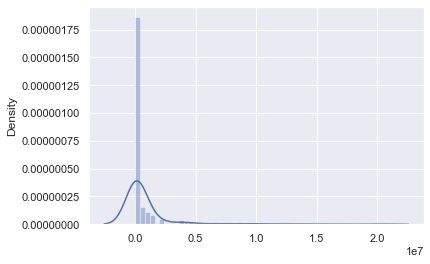

In [38]:
show_dist(K,matrix,data_df['cluster_label'])

In [39]:
show_scores(matrix,data_df)

By Geolocations For n_clusters = 205 The average silhouette_score is : 0.9879857119407918
By distance matrix For n_clusters = 205 The average silhouette_score is : 0.3072277552093434

By Geolocations For n_clusters = 205 The average dunn score is : 0.004870691226747513
By distance matrix For n_clusters = 205 The average dunn score is : 1.18653802009018
